In [1]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder
import matplotlib.pyplot as plt
import seaborn as sns
from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [2]:
import pandas as pd

# Assuming your file is in Excel format, use read_excel
data = pd.read_excel('/content/drive/MyDrive/Olive/olive_dataset1.xlsx')
data.head()


,Age yr BP,Olive influx (grains cm-2 yr-1),LOESS smooth.,2.5 percentile,97.5 percentile,Annual,Sd_1,January,Sd_2,February-March,...,Tmax Summer,Sd_7,Annual.1,Sd_8,Spring.1,Sd_9,Summer.1,Sd_10,October-November,Sd_11
0,2349,39.000000,39.000000,11.577924,64.262421,15.083333,0.195789,6.300000,0.300000,8.300000,...,28.230000,0.1,552.700000,8.100000,132.800000,4.500000,45.500000,8.100000,109.600000,3.300000
1,2369,37.869565,37.869565,22.224656,52.608346,14.973188,0.209101,6.126087,0.317391,8.152174,...,28.219565,0.1,542.769565,8.552174,128.591304,4.708696,43.413043,8.569565,107.547826,3.508696
2,2389,36.739130,36.739130,23.310060,50.427797,14.863043,0.222414,5.952174,0.334783,8.004348,...,28.209130,0.1,532.839130,9.004348,124.382609,4.917391,41.326087,9.039130,105.495652,3.717391
3,2409,35.608696,35.608696,21.430748,50.483866,14.752899,0.235726,5.778261,0.352174,7.856522,...,28.198696,0.1,522.908696,9.456522,120.173913,5.126087,39.239130,9.508696,103.443478,3.926087
4,2429,34.478261,34.478261,20.252595,50.000837,14.642754,0.249039,5.604348,0.369565,7.708696,...,28.188261,0.1,512.978261,9.908696,115.965217,5.334783,37.152174,9.978261,101.391304,4.134783


In [3]:
X = data.drop(['Olive influx (grains cm-2 yr-1)'], axis=1)
y = data['Olive influx (grains cm-2 yr-1)']

# Display the modified feature dataset
print(X)

# Display the target dataset
print(y)



     Age yr BP  LOESS smooth.  2.5 percentile  97.5 percentile     Annual  \
0         2349      39.000000       11.577924        64.262421  15.083333   
1         2369      37.869565       22.224656        52.608346  14.973188   
2         2389      36.739130       23.310060        50.427797  14.863043   
3         2409      35.608696       21.430748        50.483866  14.752899   
4         2429      34.478261       20.252595        50.000837  14.642754   
..         ...            ...             ...              ...        ...   
264       7629     138.272727      108.627372       150.094978  18.005208   
265       7649     109.300000       66.927332       109.871278  18.197917   
266       7669     127.836526      109.217057       162.585688  18.175000   
267       7689     129.612308      122.884616       161.944262  18.008333   
268       7709     128.880353      113.196615       173.946806  18.081566   

         Sd_1   January      Sd_2  February-March      Sd_3  ...  Tmax Summ

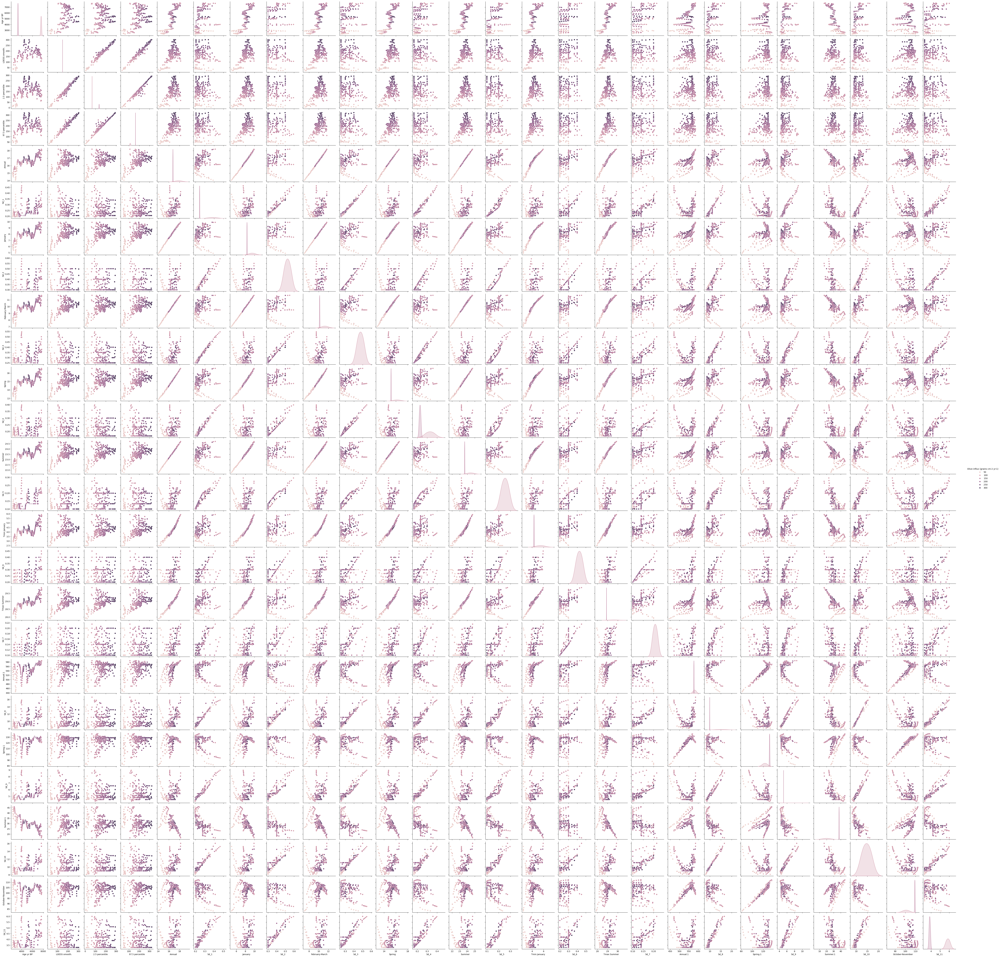

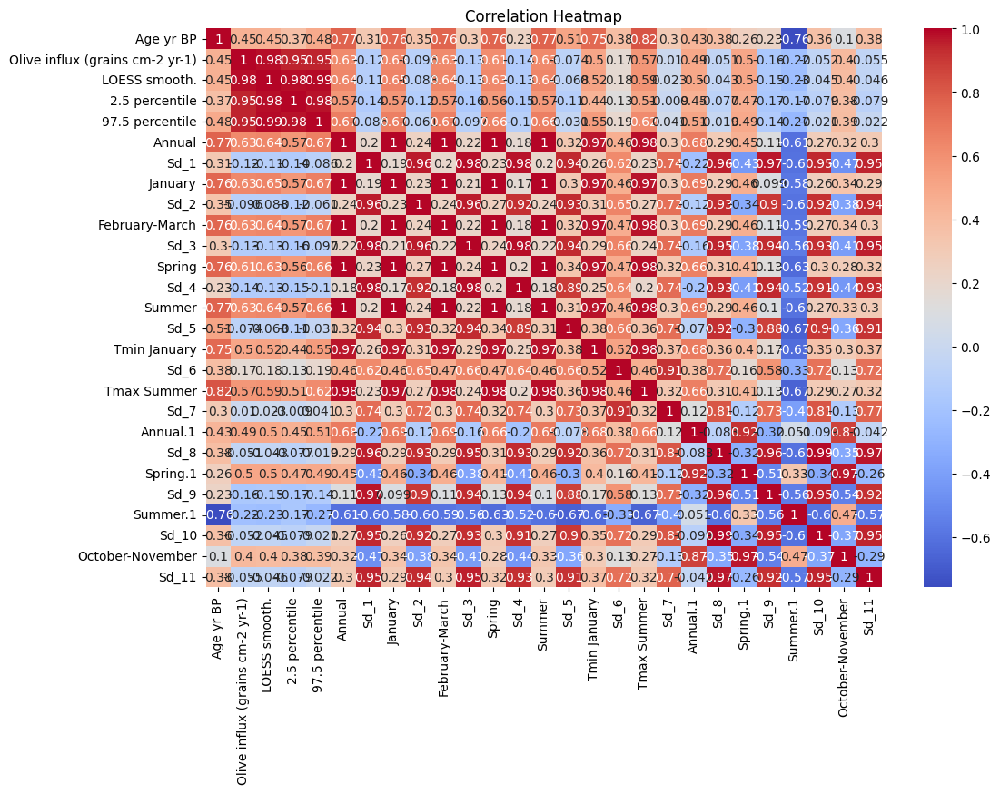

In [4]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the font family to a font available on your system
plt.rcParams['font.family'] = 'sans-serif'

# Let's explore the dataset by visualizing the distributions and relationships between variables
sns.pairplot(data, hue='Olive influx (grains cm-2 yr-1)')
plt.show()

# Correlation Heatmap
corr = data.corr()
plt.figure(figsize=(12, 8))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()


In [5]:
# Split the data into train, test, and validation sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)


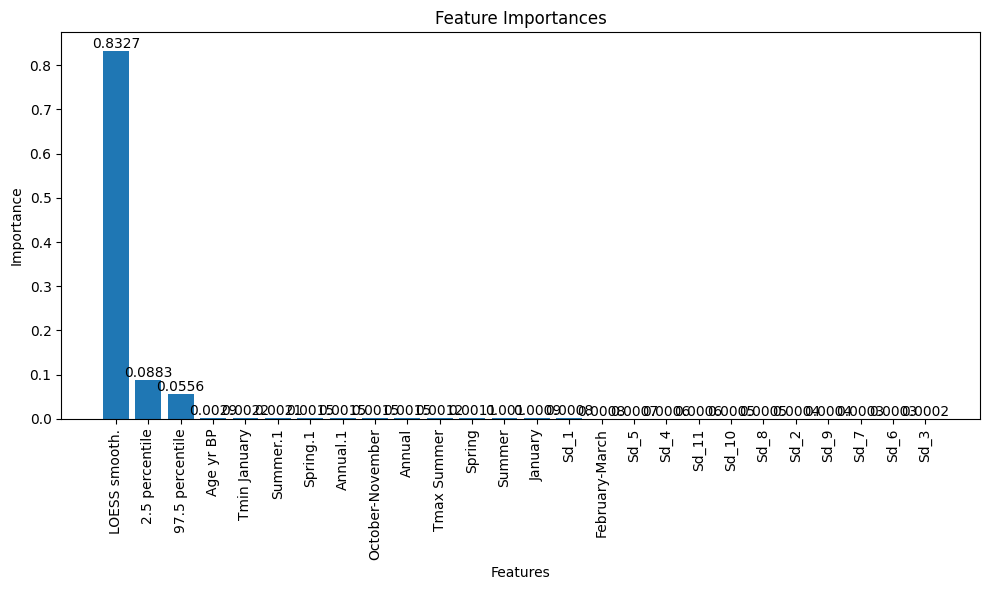

In [6]:

model = RandomForestRegressor()
model.fit(X_train, y_train)


# Importance for Select the desired features by column
# Select the desired features
selected_features = ['Age yr BP', 'LOESS smooth.', '2.5 percentile', '97.5 percentile', 'Annual', 'Sd_1', 'January', 'Sd_2', 'February-March', 'Sd_3', 'Spring', 'Sd_4', 'Summer', 'Sd_5', 'Tmin January', 'Sd_6', 'Tmax Summer', 'Sd_7', 'Annual.1', 'Sd_8', 'Spring.1', 'Sd_9', 'Summer.1', 'Sd_10', 'October-November', 'Sd_11']

# Extract feature importances for selected features
importances = model.feature_importances_
feature_names = X.columns

selected_importances = []
for feature in selected_features:
    if feature in feature_names:
        feature_index = np.where(feature_names == feature)[0][0]
        selected_importances.append(importances[feature_index])
    else:
        selected_importances.append(0)  # Assign 0 importance if feature not found

# Create a DataFrame with selected feature names and importance scores
selected_feature_importances = pd.DataFrame({'Feature': selected_features, 'Importance': selected_importances})

# Sort the DataFrame by importance scores in descending order
selected_feature_importances = selected_feature_importances.sort_values('Importance', ascending=False)


# Plot the feature importances with values displayed inside the bars
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
bars = plt.bar(selected_feature_importances['Feature'], selected_feature_importances['Importance'])
plt.xlabel("Features")
plt.ylabel("Importance")
plt.xticks(rotation=90)
plt.tight_layout()

# Add value labels to the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 4), ha='center', va='bottom')

plt.show()



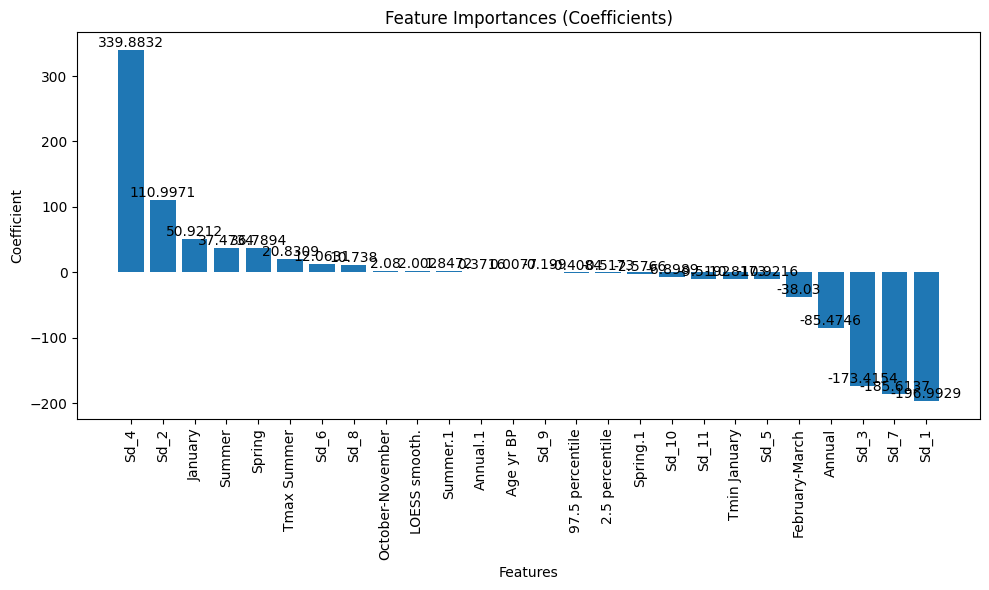

In [9]:
from sklearn.linear_model import LinearRegression
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Instantiate the LinearRegression model
model = LinearRegression()

# Fit the model
model.fit(X_train, y_train)

# Importance for Select the desired features by column
# Select the desired features
selected_features = ['Age yr BP', 'LOESS smooth.', '2.5 percentile', '97.5 percentile', 'Annual', 'Sd_1', 'January', 'Sd_2', 'February-March', 'Sd_3', 'Spring', 'Sd_4', 'Summer', 'Sd_5', 'Tmin January', 'Sd_6', 'Tmax Summer', 'Sd_7', 'Annual.1', 'Sd_8', 'Spring.1', 'Sd_9', 'Summer.1', 'Sd_10', 'October-November', 'Sd_11']

# Coefficients of the LinearRegression model can be considered as a form of feature importance for linear models
coefficients = model.coef_

# Create a DataFrame with selected feature names and coefficient values
selected_feature_importances = pd.DataFrame({'Feature': selected_features, 'Coefficient': coefficients})

# Sort the DataFrame by coefficient values in descending order
selected_feature_importances = selected_feature_importances.sort_values('Coefficient', ascending=False)

# Plot the feature importances with values displayed inside the bars
plt.figure(figsize=(10, 6))
plt.title("Feature Importances (Coefficients)")
bars = plt.bar(selected_feature_importances['Feature'], selected_feature_importances['Coefficient'])
plt.xlabel("Features")
plt.ylabel("Coefficient")
plt.xticks(rotation=90)
plt.tight_layout()

# Add value labels to the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 4), ha='center', va='bottom')

plt.show()


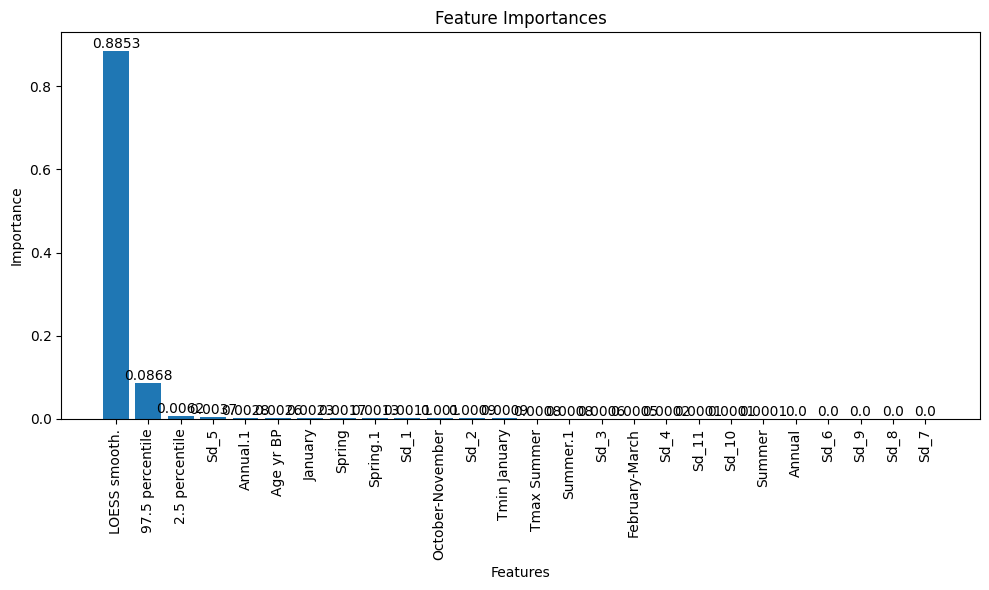

In [11]:
from sklearn.tree import DecisionTreeRegressor
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Instantiate the DecisionTreeRegressor model
model = DecisionTreeRegressor()

# Fit the model
model.fit(X_train, y_train)

# Extract feature importances
importances = model.feature_importances_
feature_names = X.columns

# Create a DataFrame with feature names and importance scores
feature_importances = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# Sort the DataFrame by importance scores in descending order
feature_importances = feature_importances.sort_values('Importance', ascending=False)

# Plot the feature importances with values displayed inside the bars
plt.figure(figsize=(10, 6))
plt.title("Feature Importances")
bars = plt.bar(feature_importances['Feature'], feature_importances['Importance'])
plt.xlabel("Features")
plt.ylabel("Importance")
plt.xticks(rotation=90)
plt.tight_layout()

# Add value labels to the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 4), ha='center', va='bottom')

plt.show()


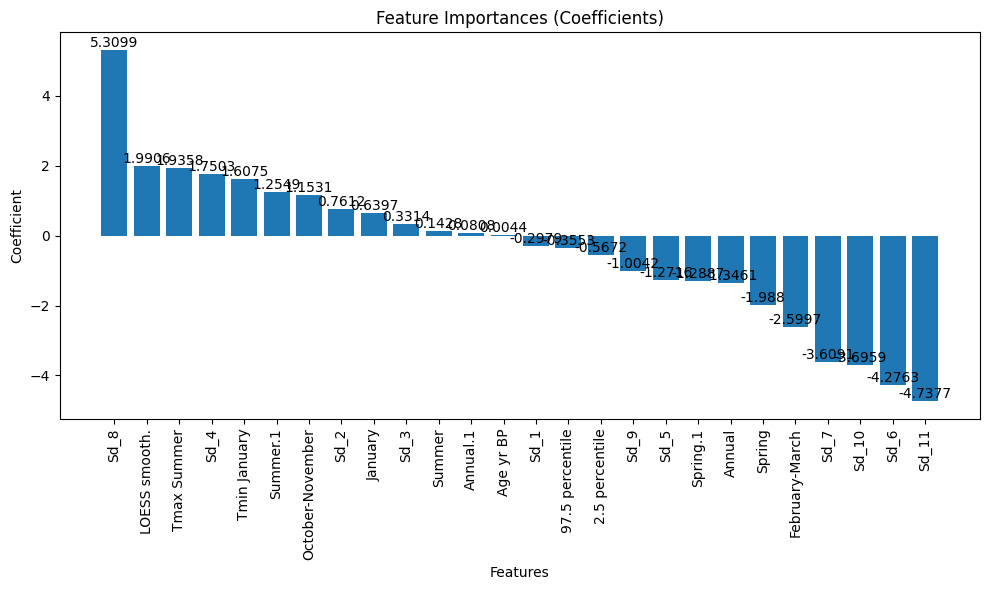

In [12]:
from sklearn.linear_model import Ridge
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Instantiate the Ridge Regression model
model = Ridge()

# Fit the model
model.fit(X_train, y_train)

# Coefficients of the Ridge Regression model can be considered as a form of feature importance for linear models
coefficients = model.coef_

# Feature names from the dataset
feature_names = X.columns

# Create a DataFrame with feature names and coefficient values
feature_importances = pd.DataFrame({'Feature': feature_names, 'Coefficient': coefficients})

# Sort the DataFrame by coefficient values in descending order
feature_importances = feature_importances.sort_values('Coefficient', ascending=False)

# Plot the feature importances with values displayed inside the bars
plt.figure(figsize=(10, 6))
plt.title("Feature Importances (Coefficients)")
bars = plt.bar(feature_importances['Feature'], feature_importances['Coefficient'])
plt.xlabel("Features")
plt.ylabel("Coefficient")
plt.xticks(rotation=90)
plt.tight_layout()

# Add value labels to the bars
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width() / 2, yval, round(yval, 4), ha='center', va='bottom')

plt.show()
